# Import

In [34]:
import pandas as pd
import numpy as np
import datetime

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor,GradientBoostingRegressor
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import TransformedTargetRegressor
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.svm import SVR
from lightgbm import LGBMRegressor

In [190]:
%matplotlib inline

sns.set_style("darkgrid")

plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams['figure.dpi'] = 420

# Read data

In [87]:
train_df = pd.read_csv("./resourcees/train.csv")
test_df = pd.read_csv("./resourcees/test.csv")
solution_df = pd.read_csv("./resourcees/sol.csv")

# Prepare data

In [88]:
rename_dict = {
    'y':"rented_bike_count",
    'Rented Bike Count':"rented_bike_count",
    "Hour":"hour",
    "Temperature(�C)":"temperature_celsius",
    "Humidity(%)":"humidity_pct",
    "Wind speed (m/s)":"wind_speed_meter_per_sec",
    "Visibility (10m)":"visibility_10_meter",
    "Dew point temperature(�C)":"dew_point_temperature_celsius",
    "Solar Radiation (MJ/m2)":"solar_radiation_mj_per_m2",
    "Rainfall(mm)":"rainfall_mm",
    "Snowfall (cm)":"snowfall_cm",
    "Seasons":"seasons",
    "Holiday":"holiday",
    "Functioning Day":"function_day"}
solution_df.rename(rename_dict,axis=1,inplace=True)
train_df.rename(rename_dict,axis=1,inplace=True)
test_df.rename(rename_dict,axis=1,inplace=True)

In [89]:
train_df.head()

,ID,Date,rented_bike_count,hour,temperature_celsius,humidity_pct,wind_speed_meter_per_sec,visibility_10_meter,dew_point_temperature_celsius,solar_radiation_mj_per_m2,rainfall_mm,snowfall_cm,seasons,holiday,function_day
0,0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [90]:
train_df.index = pd.to_datetime(train_df["Date"], format="%d/%m/%Y") + train_df["hour"].astype("timedelta64[h]")
test_df.index = pd.to_datetime(test_df["Date"], format="%d/%m/%Y") + test_df["hour"].astype("timedelta64[h]")
solution_df.index = pd.to_datetime(solution_df["Date"], format="%d-%m-%y") + solution_df["hour"].astype("timedelta64[h]")

In [91]:
drop_list = ["ID","Date"]
train_df.drop(columns=drop_list,inplace=True)
test_df.drop(columns=drop_list,inplace=True)
solution_df.drop(columns=drop_list,inplace=True)

In [121]:
train_test_concat = [train_df,test_df]
train_test = pd.concat(train_test_concat,axis=0)
train_test_x = train_test.drop(columns="rented_bike_count")
train_test_y = train_test["rented_bike_count"]

In [8]:
train_test_x.drop(columns="rented_bike_count",inplace=True)

In [15]:
train_test_x.sort_index(inplace=True)
train_test_y.sort_index(inplace=True)

In [16]:
train_test_x.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-12-01 00:00:00 to 2018-11-30 23:00:00
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   hour                           8760 non-null   int64  
 1   temperature_celsius            8760 non-null   float64
 2   humidity_pct                   8760 non-null   int64  
 3   wind_speed_meter_per_sec       8760 non-null   float64
 4   visibility_10_meter            8760 non-null   int64  
 5   dew_point_temperature_celsius  8760 non-null   float64
 6   solar_radiation_mj_per_m2      8760 non-null   float64
 7   rainfall_mm                    8760 non-null   float64
 8   snowfall_cm                    8760 non-null   float64
 9   seasons                        8760 non-null   object 
 10  holiday                        8760 non-null   object 
 11  function_day                   8760 non-null   object 
dtypes: float64(6

In [17]:
holiday_category = {"No Holiday":False,"Holiday":True}
function_day_category = {"Yes":True,"No":False}

In [18]:
train_test_x = pd.get_dummies(train_test_x,columns=["seasons"],dtype="bool",prefix='')
train_test_x["holiday"] = train_test_x.holiday.replace(holiday_category).astype("bool")
train_test_x["function_day"] = train_test_x.function_day.replace(function_day_category).astype("bool")

# Explotary Data Analysis **Again**

In [142]:
eda_df = pd.concat([train_test_x,train_test_y],axis=1)

In [187]:
eda_day_mean = eda_df.groupby(by=eda_df.index.day_of_year).mean()
eda_day_mean.index = eda_df.index.strftime("%d/%m/%Y").unique()
eda_day_mean.index = pd.to_datetime(eda_day_mean.index)
eda_day_mean.drop(columns="hour",inplace=True)

In [196]:
eda_day_mean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 365 entries, 2017-01-12 to 2018-11-30
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   temperature_celsius            365 non-null    float64
 1   humidity_pct                   365 non-null    float64
 2   wind_speed_meter_per_sec       365 non-null    float64
 3   visibility_10_meter            365 non-null    float64
 4   dew_point_temperature_celsius  365 non-null    float64
 5   solar_radiation_mj_per_m2      365 non-null    float64
 6   rainfall_mm                    365 non-null    float64
 7   snowfall_cm                    365 non-null    float64
 8   rented_bike_count              240 non-null    float64
dtypes: float64(9)
memory usage: 28.5 KB


In [198]:
sns.pairplot(data=eda_day_mean,corner=True)

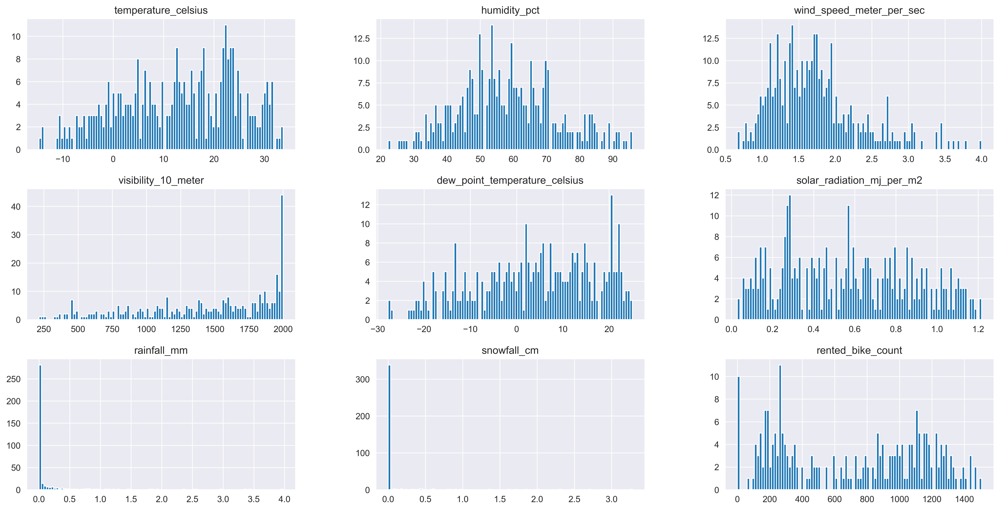

In [191]:
eda_day_mean.hist(bins=100);

<AxesSubplot:>

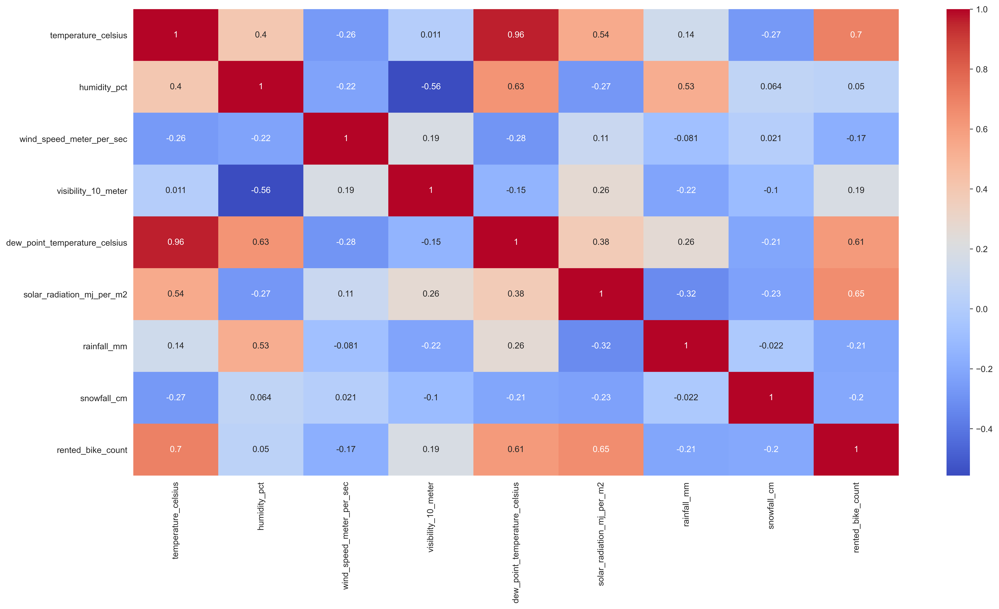

In [203]:
sns.heatmap(data=eda_day_mean.corr(),annot=True,cmap="coolwarm")

# Train - Validation - Test **Split** 

In [75]:
months = [12,1,2,3,4,5,6,7,8,9,10,11]
years = [2017,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018,2018]
validation_x = pd.DataFrame()
for month,year in zip(months,years):
    validation_x = validation_x.append(train_test_x.loc[f"{year}/{month}/{19}"])

In [76]:
validation_y = train_test_y[train_test_y.index.isin(validation_x.index)]
train_y = train_test_y.dropna()
train_x = train_test_x[train_test_x.index.isin(train_y.index)]
test_x = train_test_x[~train_test_x.index.isin(train_x.index)]
test_y = solution_df.rented_bike_count

In [77]:
train_x_v = train_x[~train_x.index.isin(validation_x.index)]
train_y_v = train_y[~train_y.index.isin(validation_y.index)]

# **Model**

In [78]:
class CustomCrossValidation:
    @classmethod
    def split_groups(cls,
              X: pd.DataFrame,
              y: np.ndarray = None,
              groups: np.ndarray = None):
        """Returns to a grouped time series split generator."""
        assert len(X) == len(groups),  (
            "Length of the predictors is not"
            "matching with the groups.")
        # The min max index must be sorted in the range
        for group_idx in range(groups.min(), groups.max()):

            test_group = group_idx
            training_indices = np.where(
                groups != test_group)[0]
            test_indices = np.where(groups == test_group)[0]
            if len(test_indices) > 0:
                # Yielding to training and testing indices
                # for cross-validation generator
                yield training_indices, test_indices

In [108]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer
def tune_hyper_parameter(regressor,grid,iteration):
    optimized_model = RandomizedSearchCV(estimator=regressor,param_distributions=grid,n_iter=iteration,cv=CustomCrossValidation.split_groups(train_x,train_y,train_x.index.day),scoring=make_scorer(r2_score),n_jobs=-1,verbose=10,random_state=42)
    optimized_model.fit(train_x,train_y)
    return optimized_model.best_params_

In [80]:
train_x

,hour,temperature_celsius,humidity_pct,wind_speed_meter_per_sec,visibility_10_meter,dew_point_temperature_celsius,solar_radiation_mj_per_m2,rainfall_mm,snowfall_cm,holiday,function_day,_Autumn,_Spring,_Summer,_Winter
2017-12-01 00:00:00,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,False,True,False,False,False,True
2017-12-01 01:00:00,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,False,True,False,False,False,True
2017-12-01 02:00:00,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,False,True,False,False,False,True
2017-12-01 03:00:00,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,False,True,False,False,False,True
2017-12-01 04:00:00,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-20 19:00:00,19,8.7,34,2.2,1857,-6.3,0.0,0.0,0.0,False,True,True,False,False,False
2018-11-20 20:00:00,20,8.5,32,2.6,1789,-7.2,0.0,0.0,0.0,False,True,True,False,False,False
2018-11-20 21:00:00,21,8.8,37,3.8,1750,-5.1,0.0,0.0,0.0,False,True,True,False,False,False
2018-11-20 22:00:00,22,8.9,40,3.4,1810,-3.9,0.0,0.0,0.0,False,True,True,False,False,False


In [81]:
def evaluate(y_true,y_pred):
    print(f"R2 Score: {r2_score(y_true,y_pred)}")
    print(f"RMSE Score: {np.sqrt(mean_squared_error(y_true,y_pred))}")
    print(f"RMLSE Score: {np.sqrt(mean_squared_log_error(y_true,y_pred))}")
    return np.sqrt(mean_squared_log_error(y_true,y_pred))

In [82]:
power_transformer = PowerTransformer()

## Gradient Boosting Regressor 0.48

In [83]:
def power(val):
    return np.power(val,1/30)

def rev_power(val):
    return np.power(val,30)

In [84]:
gradient_boosting = GradientBoostingRegressor(n_estimators=434, subsample= 0.9, random_state= 74, min_samples_split= 16, min_weight_fraction_leaf = 0,
max_features= 'auto')

gradient_boosting_trans = TransformedTargetRegressor(regressor=gradient_boosting, func=power,inverse_func=rev_power).fit(train_x, train_y)

gradient_boosting_prediction = gradient_boosting_trans.predict(test_x)

gradient_boosting_prediction[gradient_boosting_prediction < 0] = 0
evaluate(test_y,gradient_boosting_prediction)

R2 Score: 0.8338081317610387
RMSE Score: 254.7263292495362
RMLSE Score: 0.4755030118752115


0.4755030118752115

In [108]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer
def tune_hyper_parameter(regressor,grid,iteration):
    optimized_model = RandomizedSearchCV(estimator=regressor,param_distributions=grid,n_iter=iteration,cv=CustomCrossValidation.split_groups(train_x,train_y,train_x.index.day),scoring=make_scorer(r2_score),n_jobs=-1,verbose=10,random_state=42)
    optimized_model.fit(train_x,train_y)
    return optimized_model.best_params_

## Extra tree 0.53 

In [107]:
extra_tree = ExtraTreesRegressor(n_estimators=400,n_jobs=-1,random_state=20)
extra_tree_trans = TransformedTargetRegressor(regressor=extra_tree, func=power,inverse_func=rev_power).fit(train_x, train_y)
extra_tree_prediction = extra_tree_trans.predict(test_x)
extra_tree_prediction[extra_tree_prediction < 0] = 0
evaluate(test_y,extra_tree_prediction)

R2 Score: 0.8159290280780577
RMSE Score: 268.0782655444545
RMLSE Score: 0.5331219148993244


0.5331219148993244

## LGBM

In [86]:
ada_lgbm = AdaBoostRegressor(LGBMRegressor(), random_state=25, n_estimators= 69)

ada_lgbm_trans = TransformedTargetRegressor(regressor=ada_lgbm, func=power,inverse_func=rev_power).fit(train_x, train_y)

ada_lgbm_prediction = ada_lgbm_trans.predict(test_x)

# yPredA = np.abs(yPredA)
ada_lgbm_prediction[ada_lgbm_prediction < 0] = 0
evaluate(test_y,ada_lgbm_prediction)

KeyboardInterrupt: 

## Hist Gradient Boosting Regressor 0.51

In [ ]:
hist_gradient_boosting = HistGradientBoostingRegressor(loss='poisson', max_bins= 255, max_iter = 100, scoring='neg_mean_squared_log_error', max_depth=100,
min_samples_leaf= 7)

hist_gradient_boosting_trans = TransformedTargetRegressor(regressor=hist_gradient_boosting, func=np.log1p,inverse_func=np.expm1).fit(train_x, train_y)

hist_gradient_boosting_prediction = hist_gradient_boosting_trans.predict(test_x)

hist_gradient_boosting_prediction[hist_gradient_boosting_prediction < 0] = 0
evaluate(test_y,hist_gradient_boosting_prediction)

R2 Score: 0.8363067608564029
RMSE Score: 252.8042224866374
RMLSE Score: 0.49900104591353334


0.49900104591353334

## Staking Regressor

In [ ]:
stack_reg = StackingRegressor(estimators=[("one",hist_gradient_boosting_trans),("two",ada_lgbm_trans),("three",gradient_boosting_trans)],final_estimator=ExtraTreesRegressor())
stack_reg.fit(train_x, train_y)
yPredS = stack_reg.predict(test_x)
yPredS[yPredS < 0] = 0

In [ ]:
evaluate(test_y,yPredS)

R2 Score: 0.7829430517246583
RMSE Score: 291.10911140235146
RMLSE Score: 0.5851282678718863


0.5851282678718863

## Blinding

In [ ]:
 pred = gradient_boosting_prediction*0.5 + ada_lgbm_prediction*0.3 + hist_gradient_boosting_prediction*0.2 + yPredS*0
 evaluate(test_y,pred)

R2 Score: 0.8378578469329938
RMSE Score: 251.6036401316756
RMLSE Score: 0.47712217836092813


0.47712217836092813

In [ ]:
res = []
for w1 in np.arange(0,1,step=0.1):
    for w2 in np.arange(0,1,step=0.1):
        for w3 in np.arange(0,1,step=0.1):
            for w4 in np.arange(0,1,step=0.1):
                pred = gradient_boosting_prediction*w1 + ada_lgbm_prediction*w2 + hist_gradient_boosting_prediction*w3 + yPredS*w4
                res.append((evaluate(test_y,pred),[w1,w2,w3,w4]))

R2 Score: -1.2793592127384636
RMSE Score: 943.3553973273629
RMLSE Score: 6.143343465501711
R2 Score: -0.8744244685294456
RMSE Score: 855.4663372839487
RMLSE Score: 2.15518043267294
R2 Score: -0.513646283823251
RMSE Score: 768.7429602036857
RMLSE Score: 1.51431715611987
R2 Score: -0.1970246586198796
RMSE Score: 683.6290365225856
RMLSE Score: 1.154020137930538
R2 Score: 0.07544040708066779
RMSE Score: 600.8089682821276
RMLSE Score: 0.9164834161703075
R2 Score: 0.3037489132783917
RMSE Score: 521.3770317505684
RMLSE Score: 0.7539040084855284
R2 Score: 0.48790085997329224
RMSE Score: 447.14252558126765
RMLSE Score: 0.6466548482932535
R2 Score: 0.627896247165369
RMSE Score: 381.15443485117504
RMLSE Score: 0.5844892607427522
R2 Score: 0.7237350748546223
RMSE Score: 328.4216867193842
RMLSE Score: 0.5592780775324018
R2 Score: 0.775417343041052
RMSE Score: 296.1127175348176
RMLSE Score: 0.5623794136457236
R2 Score: -0.8842954034681016
RMSE Score: 857.7158716806922
RMLSE Score: 2.287002082811346


In [ ]:
min(res)

(0.47631510209700206, [0.7000000000000001, 0.2, 0.1, 0.0])

In [144]:
# loss = ["deviance","exponential"]
learning_rate = np.arange(0.01,1,step=0.08)
n_estimators = np.arange(50,150,step=10)
subsample = np.arange(0.1,1,step=0.1)
criterion = ["friedman_mse", "mse", "mae"]
min_samples_split = [2, 5, 10, 15, 20]
min_samples_leaf = [1, 2, 4, 6, 8]
min_weight_fraction_leaf = np.arange(0,0.01,step=0.001)
max_depth = np.arange(1,500,step=20)
init = [None,0,ExtraTreesRegressor()]
random_state = np.arange(12,42,step=1)
max_features = ["auto", "sqrt", "log2"]
warm_start = [True,False]

grad_grid = {
    "learning_rate":learning_rate,
    "n_estimators":n_estimators,
    "subsample":subsample,
    "criterion":criterion,
    "min_samples_split":min_samples_split,
    "min_samples_leaf":min_samples_leaf,
    "min_weight_fraction_leaf":min_weight_fraction_leaf,
    "max_depth":max_depth,
    # "init":init,
    # "random_state":random_state,
    "max_features":max_features,
    # "warm_start":warm_start,
}

display(grad_grid)

{'learning_rate': array([0.01, 0.09, 0.17, 0.25, 0.33, 0.41, 0.49, 0.57, 0.65, 0.73, 0.81,
        0.89, 0.97]),
 'n_estimators': array([ 50,  60,  70,  80,  90, 100, 110, 120, 130, 140]),
 'subsample': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 'criterion': ['friedman_mse', 'mse', 'mae'],
 'min_samples_split': [2, 5, 10, 15, 20],
 'min_samples_leaf': [1, 2, 4, 6, 8],
 'min_weight_fraction_leaf': array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
        0.009]),
 'max_depth': array([  1,  21,  41,  61,  81, 101, 121, 141, 161, 181, 201, 221, 241,
        261, 281, 301, 321, 341, 361, 381, 401, 421, 441, 461, 481])}

In [108]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer
def tune_hyper_parameter(regressor,grid,iteration):
    optimized_model = RandomizedSearchCV(estimator=regressor,param_distributions=grid,n_iter=iteration,cv=CustomCrossValidation.split_groups(train_x,train_y,train_x.index.day),scoring=make_scorer(r2_score),n_jobs=-1,verbose=10,random_state=42)
    optimized_model.fit(train_x,train_y)
    return optimized_model.best_params_

In [105]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'log2', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10, 15, 20]
min_samples_leaf = [1, 2, 4, 6, 8]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
display(tree_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000],
 'max_features': ['auto', 'log2', 'sqrt'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10, 15, 20],
 'min_samples_leaf': [1, 2, 4, 6, 8],
 'bootstrap': [True, False]}

In [134]:
a = tune_hyper_parameter(extra_tree,random_grid,1)

Fitting 19 folds for each of 1 candidates, totalling 19 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done   6 out of  17 | elapsed:   28.2s remaining:   51.8s
[Parallel(n_jobs=-1)]: Done   8 out of  17 | elapsed:   28.2s remaining:   31.8s
[Parallel(n_jobs=-1)]: Done  10 out of  17 | elapsed:   28.2s remaining:   19.7s
[Parallel(n_jobs=-1)]: Done  12 out of  17 | elapsed:   28.2s remaining:   11.7s
[Parallel(n_jobs=-1)]: Done  14 out of  17 | elapsed:   28.2s remaining:    6.0s


KeyboardInterrupt: 

In [116]:
a

{'n_estimators': 1200,
 'min_samples_split': 20,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 100,
 'bootstrap': False}

In [117]:
extra_tree = ExtraTreesRegressor(**a)
extra_tree_trans = TransformedTargetRegressor(regressor=extra_tree, func=power,inverse_func=rev_power).fit(train_x, train_y)
extra_tree_prediction = extra_tree_trans.predict(test_x)
extra_tree_prediction[extra_tree_prediction < 0] = 0
evaluate(test_y,extra_tree_prediction)

R2 Score: 0.8223770187140786
RMSE Score: 263.3410299559808
RMLSE Score: 0.5193861164309137


0.5193861164309137

In [146]:
b = tune_hyper_parameter(GradientBoostingRegressor(),grad_grid,5)

Fitting 19 folds for each of 5 candidates, totalling 95 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


In [136]:
gradient_boosting = GradientBoostingRegressor(**b)

gradient_boosting_trans = TransformedTargetRegressor(regressor=gradient_boosting, func=power,inverse_func=rev_power).fit(train_x, train_y)

gradient_boosting_prediction = gradient_boosting_trans.predict(test_x)

gradient_boosting_prediction[gradient_boosting_prediction < 0] = 0
evaluate(test_y,gradient_boosting_prediction)

R2 Score: -18341994.643317483
RMSE Score: 2676037.80929993
RMLSE Score: 1.368758696634233


1.368758696634233